In [11]:
%load_ext autoreload
%autoreload 2

import numpy as np
from scipy.io import loadmat
import matplotlib.pyplot as plt
import seaborn as sns
from copy import deepcopy
import glob, sys, os

[sys.path.append(f) for f in glob.glob('../utils/*')]
from preprocess import *
from plotting_utils import *
from lineplots import plotsd
from stabilizer_utils import *
from recalibration_utils import *
from session_utils import *

import hmm_utils
from hmm import HMMRecalibration
import stabilizer_utils

from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score


min_nblocks    = 2
participant    = 'T5'


FILE_DIR       = os.path.join(DATA_DIR, participant, 'raw_data')
filelist       = glob.glob(os.path.join(FILE_DIR, 'historical/*'))
filelist.extend(glob.glob(os.path.join(FILE_DIR, 'new/*')))

block_constraints = getBlockConstraints(FILE_DIR)
files             = get_Sessions(filelist, min_nblocks,  block_constraints = block_constraints)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### train linear regression on day 0, get baseline performance measure


In [13]:
# general settings:
ref_idx    = 1
new_idx    = 5
train_size = 0.67
sigma      = 2
task       = None

# recalibration settings:
hmm_cfg  = {'gridSize' : 20, 'stayProb' : 0.999, 'vmKappa' : 2, 'inflection' : 70, 'exp' : 0.5, 'probThreshold' : 'probWeighted'}
stab_cfg = {'model_type' : 'FactorAnalysis', 'n_components' : 6, 'B' : 160, 'thresh' : 0.01}

In [14]:
# Get initial day performance and decoder:
fields     = ['TX', 'cursorPos', 'targetPos']


ref_file    = files[ref_idx]
day0        = DataStruct(ref_file, alignScreens = True, causal_filter = sigma)
session_dat = getTrainTest(day0, train_size = train_size, task = task, blocks = block_constraints[ref_file], 
                           fields = fields, returnFlattened = True)

ref_train_y     = np.concatenate(session_dat['train_targetPos']) - np.concatenate(session_dat['train_cursorPos'])
ref_test_y      = np.concatenate(session_dat['test_targetPos']) - np.concatenate(session_dat['test_cursorPos'])
ref_train_x, ref_test_x = subtractMeans(session_dat['train_TX'], session_dat['test_TX'], method = 'blockwise', concatenate = True)

# fit a regular regression model
ref_decoder = LinearRegression(fit_intercept = False).fit(ref_train_x, ref_train_y)
ref_score   = ref_decoder.score(ref_test_x, ref_test_y)

# fit a factor-analysis based model
stab = stabilizer_utils.Stabilizer(model_type = stab_cfg['model_type'], n_components = stab_cfg['n_components'])
stab.fit_ref(ref_train_x)
stab_data  = {'ref_latents' : stab.ref_model.transform(ref_test_x),
              'ref_y' : ref_test_y}

latent_decoder = LinearRegression(fit_intercept = False).fit(stab.ref_model.transform(ref_train_x), ref_train_y)
latent_score   = latent_decoder.score(stab.ref_model.transform(ref_test_x), ref_test_y)

print('Performance on reference day: R^2 = ', ref_score)
print('Performance on reference day w/ latent decoder: R^2 = ', latent_score)

Performance on reference day: R^2 =  0.43060201416462035
Performance on reference day w/ latent decoder: R^2 =  0.3814552102865809


Load new session and plot some data from the first blocks. We'll visualize some neural firing rates and cursor kinematic signals:

In [ ]:
matplotlib.rcParams['figure.figsize'] = [15, 10]


file        = files[new_idx]
new_dat     = DataStruct(file, alignScreens = True, causal_filter = sigma)
blocks      = block_constraints[file]
session_dat = getTrainTest(new_dat, train_size = train_size, task = task, blocks = blocks, fields = fields, returnFlattened = True)

new_train_y         = np.concatenate(session_dat['train_targetPos']) - np.concatenate(session_dat['train_cursorPos'])
new_test_y          = np.concatenate(session_dat['test_targetPos']) - np.concatenate(session_dat['test_cursorPos'])
new_train_x, new_test_x = subtractMeans(session_dat['train_TX'], session_dat['test_TX'], method = 'blockwise', concatenate = True)
new_cursorPos       = np.concatenate(session_dat['train_cursorPos'])
new_targetPos       = np.concatenate(session_dat['train_targetPos'])

rawDecTraj          = ref_decoder.predict(new_train_x)


# plotting code: 
colors = ['blue', 'orange']
window = np.arange(8000, 10000) 

plt.subplot(311)
n_channels = 8
_  = plt.plot(window * 0.02, new_train_x[window, :n_channels] + np.arange(n_channels) * 300, c = 'k', label = None)
ax = plt.gca()

plt.subplot(312)
_ = plt.plot(new_cursorPos[window, 0], label = 'x pos', c = colors[0])
_ = plt.plot(new_cursorPos[window, 1], label = 'y pos', c = colors[1])

plt.subplot(313)
_ = plt.plot(rawDecTraj[window, 0], label = 'x velocity', c = colors[0])
_ = plt.plot(rawDecTraj[window, 1], label = 'y velocity', c = colors[1])

for i in range(3):
    plt.subplot(3,1,i+1)
    plt.gca()
    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.legend()


plt.tight_layout()

plt.savefig(FIG_DIR + 'HMM/T5example_firingrates_and_cursor', format = 'pdf')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Now fit PRI-T to this data:

In [ ]:
targLocs        = hmm_utils.generateTargetGrid(hmm_cfg['gridSize'], is_simulated = False,
                                               struct = new_dat, task = task)
statetrans, pStateStart = hmm_utils.generateTransitionMatrix(hmm_cfg['gridSize'], hmm_cfg['stayProb'])
adjustKappa = lambda dist : 1 / (1 + np.exp(-1 * (dist - hmm_cfg['inflection']) * hmm_cfg['exp']))


hmm         = HMMRecalibration(stateTrans, targLocs, pStateStart, hmm_cfg['vmKappa'], adjustKappa)

viterbi_seq, targStates = hmm.predict([new_cursorPos], [rawDecTraj])
maxProb                 = np.max(targStates, axis = 0)  # get P(H_i | O_1, ...., O_n)
inferredTargLoc         = targLocs[viterbi_seq.astype(int), :] 

Then fit FA stabilizer:

In [ ]:
stab.fit_new(new_train_x, B = stab_cfg['B'], thresh = stab_cfg['thresh'])

stab_data['new_latents'] = stab.ref_model.transform(new_test_x)
stab_data['new_y']       = new_test_y

stab_data['stabilized_latents'] = stab.transform(new_test_x)
stab_data['stabilized_y']       = new_test_y

In [ ]:
import CosineTuning
from mpl_toolkits import mplot3d

figSize(7, 20)


for i, field in enumerate(['ref', 'stabilized', 'new']):
    displacements = stab_data[field + '_y']
    latents       = stab_data[field + '_latents']
    #latents = firingrate.gaussian_filter1d(latents, axis = 0, sigma = 2, causal=True)
    #displacements = firingrate.gaussian_filter1d(displacements, axis = 0, sigma = 2, causal=True)

    time_idxs = np.where(np.linalg.norm(displacements, axis = 1) > 200)[0]#[1000:7000]
    angles    = CosineTuning.getAngles(displacements[time_idxs])
    coords    = latents[time_idxs, :3]
    
    ax     = plt.subplot(1, 3, i + 1, projection='3d')
    ax.scatter3D(coords[:, 0], coords[:, 1], coords[:, 2], s= 20,
                 c = angles, cmap = 'hsv', alpha = 0.3, rasterized = True)
    ax.view_init(20, 320)  #320

    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.set_zlim([-2, 4])
    
    plt.xlabel('Comp 1')
    plt.ylabel('Comp 2')
    ax.set_zlabel('Comp 3')
    
    r2 = latent_decoder.score(latents, displacements)
    plt.title('R2 = {}'.format(r2))

plt.savefig(FIG_DIR + 'stabilizer/T5example', format = 'pdf')
plt.show()

In [ ]:
figSize(5, 15)

window = np.arange(8000, 10000) 


plt.subplot(3, 2, 2)
_ = plt.plot(targStates[window, :])
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.xlabel('Time')
plt.ylabel('Probability')

titles = ['Target X-location', 'Target Y-location']
for i in range(2):
    plt.subplot(3, 2, (i * 2) + 4)
    plt.plot((new_train_y + new_cursorPos)[window, i], label = 'Actual', c = 'k')
    plt.plot(inferredTargLoc[window, i], label = 'Inferred', zorder = 10)
    
    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.xlabel('Time')
    plt.legend()
    plt.title(titles[i])
    
plt.savefig(FIG_DIR + 'HMM/T5example_cursorandneural', format = 'pdf')

plt.tight_layout()
plt.show()

<Figure size 750x750 with 0 Axes>

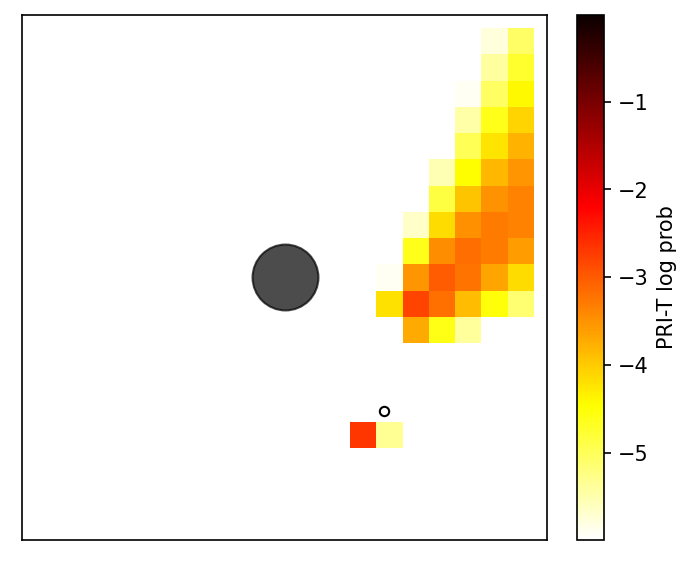

In [33]:
from utils.plotting.animatedplots import createHeatmapAnimation
from IPython.display import HTML

figSize(5, 5)
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
#plt.ioff()
fig = plt.figure()

marker_size = 20
cursor_color = 'white'
target_color = 'k'
cmap         = 'hot_r'
toggle_log   = True


anim = createHeatmapAnimation(targStates, targLocs, new_cursorPos, targetPos=new_targetPos, 
                              toggle_log=toggle_log, cursor_color = cursor_color, marker_size=marker_size, 
                              target_color = target_color, cmap = cmap)

HTML(anim.to_jshtml())